In [1]:
!pip install --upgrade pip
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 17.9 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: pip
    Found existing installation: pip 24.0
    Uninstalling pip-24.0:
      Successfully uninstalled pip-24.0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 874.1/874.1 kB 18.9 MB/s eta 0:00:00


In [2]:
import torch
torch.cuda.empty_cache()
torch.cuda.device_count()

1

In [3]:
import os
import torch
from ultralytics import YOLO

# Set environment variable to avoid fragmentation
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'

# Clear CUDA cache
torch.cuda.empty_cache()

# Load YOLO model
model = YOLO('yolov5m.pt')

# Train the model with adjusted settings
train_results = model.train(
    data='/kaggle/input/another-data/data.yaml',
    epochs=50,                # Increase the number of epochs for more training
    imgsz=640,                # Image size for training
    batch=32,                 # Increase batch size if GPU memory allows
    lr0=0.01,                 # Learning rate (adjust based on performance)
    device="0",                  # Use GPU 0 (change to -1 for CPU)
    augment=True,             # Enable data augmentation for better generalization
    weight_decay=0.0005,      # Add weight decay for regularization (to prevent overfitting)
    patience=5,               # Early stopping patience (stop training if performance doesn't improve)
    workers=8,                # Number of workers for data loading (adjust based on resources)
)

# Validate the model on the validation set after training
model.val(data='//kaggle/input/another-data/data.yaml')


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
PRO TIP 💡 Replace 'model=yolov5m.pt' with new 'model=yolov5mu.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 48.2M/48.2M [00:01<00:00, 43.0MB/s]


Ultralytics YOLOv8.2.101 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov5m.pt, data=/kaggle/input/another-data/data.yaml, epochs=50, time=None, patience=5, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=

100%|██████████| 755k/755k [00:00<00:00, 3.98MB/s]
2024-09-25 13:52:21,036	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-09-25 13:52:22,012	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      5280  ultralytics.nn.modules.conv.Conv             [3, 48, 6, 2, 2]              
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2     65280  ultralytics.nn.modules.block.C3              [96, 96, 2]                   
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    444672  ultralytics.nn.modules.block.C3              [192, 192, 4]                 
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  6   2512896  ultralytics.nn.modules.block.C3              [384, 384, 6]                 
  7                  -1  1   2655744  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.24.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.25M/6.25M [00:00<00:00, 22.6MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/another-data/train/labels... 2733 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2733/2733 [00:06<00:00, 429.76it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/another-data/train is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 4092, len(boxes) = 4095. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.16 (you have 1.4.14). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/another-data/valid/labels... 204 images, 0 backgrounds, 0 corrupt: 100%|██████████| 204/204 [00:00<00:00, 370.23it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/another-data/valid is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 290, len(boxes) = 291. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 91 weight(decay=0.0), 98 weight(decay=0.0005), 97 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      12.2G       1.96      2.844       2.12         38        640: 100%|██████████| 86/86 [01:23<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


                   all        204        291    0.00293     0.0206    0.00046   0.000147

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50        12G      2.111      2.837        2.3         36        640: 100%|██████████| 86/86 [01:22<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.63it/s]


                   all        204        291      0.172     0.0584     0.0429     0.0106

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50        12G      2.086      2.765      2.253         32        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]


                   all        204        291     0.0523      0.113     0.0343     0.0133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50        12G      2.071      2.733      2.217         41        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.53it/s]


                   all        204        291      0.107      0.292     0.0821     0.0266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50        12G      2.011      2.673       2.15         42        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.64it/s]


                   all        204        291       0.24      0.247      0.149     0.0486

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50        12G      1.954      2.562      2.106         36        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]


                   all        204        291      0.104      0.137     0.0625     0.0204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50        12G      1.913      2.508      2.052         44        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.65it/s]


                   all        204        291      0.238      0.247      0.167     0.0565

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50        12G      1.886      2.459      2.031         39        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.64it/s]


                   all        204        291      0.223      0.241      0.148     0.0468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50        12G      1.881      2.455      2.039         30        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.64it/s]


                   all        204        291       0.39      0.378      0.307      0.118

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50        12G       1.85      2.379      1.999         26        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]

                   all        204        291      0.318      0.337      0.267     0.0998



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50        12G      1.816      2.332      1.965         48        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.65it/s]

                   all        204        291      0.456      0.381      0.369      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50        12G      1.793      2.293      1.959         44        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.67it/s]

                   all        204        291       0.33      0.326      0.268      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50        12G      1.764      2.247      1.948         27        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]

                   all        204        291      0.395      0.375       0.31       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50        12G      1.797      2.293      1.972         30        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.64it/s]

                   all        204        291       0.45      0.313      0.335      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50        12G      1.739      2.194      1.922         40        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.67it/s]

                   all        204        291       0.45      0.347      0.355      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50        12G      1.726      2.179      1.902         34        640: 100%|██████████| 86/86 [01:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.64it/s]

                   all        204        291      0.391      0.364      0.309      0.125


EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 11, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

16 epochs completed in 0.385 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 50.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 50.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.101 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv5m summary (fused): 248 layers, 25,045,795 parameters, 0 gradients, 64.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.58s/it]


                   all        204        291      0.464      0.419        0.4      0.186
Speed: 0.2ms preprocess, 26.2ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▁▅███▇▇▇▇▆▆▆▆▆▅▅
lr/pg1,▁▅███▇▇▇▇▆▆▆▆▆▅▅
lr/pg2,▁▅███▇▇▇▇▆▆▆▆▆▅▅
metrics/mAP50(B),▁▂▂▂▄▂▄▄▆▆▇▆▆▇▇█
metrics/mAP50-95(B),▁▁▁▂▃▂▃▃▅▅▇▅▆▆▇█
metrics/precision(B),▁▄▂▃▅▃▅▄▇▆█▆▇███
metrics/recall(B),▁▂▃▆▅▃▅▅▇▇▇▆▇▆▇█
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▅██▇▆▅▄▄▄▃▃▂▂▂▁▁


Ultralytics YOLOv8.2.101 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv5m summary (fused): 248 layers, 25,045,795 parameters, 0 gradients, 64.0 GFLOPs


val: Scanning /kaggle/input/another-data/valid/labels... 204 images, 0 backgrounds, 0 corrupt: 100%|██████████| 204/204 [00:00<00:00, 727.09it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/another-data/valid is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 290, len(boxes) = 291. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.13s/it]


                   all        204        291      0.465      0.419        0.4      0.185
Speed: 0.2ms preprocess, 22.7ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ce96d66d450>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [7]:
# Save the model after training
model.save('/kaggle/yolo5m_model.pt')  

In [6]:
import shutil
# Create a zip archive for easier download
shutil.make_archive('/kaggle/working/yolo5m_model', 'zip', '/kaggle/working', 'yolo5m_model.pt')

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/yolo5m_model.pt'

In [8]:
# Define output directory
output_dir = '/kaggle/working/output'

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Predict on test images and save in YOLO format
model.predict(
    source='/kaggle/input/dpr-dataset/SplittedDataset/test/low/buccal_mucosa_right',
    save=True,
    save_txt=True,             # Save bounding boxes as .txt files (YOLO format)
    save_conf=True,            # Save confidence scores in the .txt files
    save_dir=output_dir,       # Use the created output directory
    conf=0.15,
    hide_labels=False,         # Show class labels (if necessary for your use case)
    hide_conf=False            # Show confidence scores (if necessary for your use case)
)

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in in the future. Use 'show_labels' instead.
WARNING ⚠️ 'hide_conf' is deprecated and will be removed in in the future. Use 'show_conf' instead.

image 1/29 /kaggle/input/dpr-dataset/SplittedDataset/test/low/buccal_mucosa_right/low_buccal_mucosa_right_105.jpg: 640x640 2 Lesionss, 109.3ms
image 2/29 /kaggle/input/dpr-dataset/SplittedDataset/test/low/buccal_mucosa_right/low_buccal_mucosa_right_111.jpg: 640x640 1 Lesions, 45.0ms
image 3/29 /kaggle/input/dpr-dataset/SplittedDataset/test/low/buccal_mucosa_right/low_buccal_mucosa_right_116.jpg: 640x640 4 Lesionss, 43.6ms
image 4/29 /kaggle/input/dpr-dataset/SplittedDataset/test/low/buccal_mucosa_right/low_buccal_mucosa_right_128.jpg: 640x640 1 Lesions, 42.8ms
image 5/29 /kaggle/input/dpr-dataset/SplittedDataset/test/low/buccal_mucosa_right/low_buccal_mucosa_right_13.jpg: 640x640 3 Lesionss, 41.7ms
image 6/29 /kaggle/input/dpr-dataset/SplittedDataset/test/low/buccal_mucosa_right/low_b

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Lesions'}
 obb: None
 orig_img: array([[[ 14,  13,  15],
         [ 14,  13,  15],
         [ 14,  13,  15],
         ...,
         [195, 199, 234],
         [195, 199, 234],
         [195, 199, 234]],
 
        [[ 14,  13,  15],
         [ 14,  13,  15],
         [ 14,  13,  15],
         ...,
         [194, 198, 233],
         [194, 198, 233],
         [194, 198, 233]],
 
        [[ 14,  13,  15],
         [ 14,  13,  15],
         [ 14,  13,  15],
         ...,
         [194, 198, 233],
         [194, 198, 233],
         [194, 198, 233]],
 
        ...,
 
        [[ 53,  44,  71],
         [ 82,  72, 102],
         [102,  91, 129],
         ...,
         [166, 163, 213],
         [166, 163, 213],
         [166, 163, 213]],
 
        [[ 57,  47,  77],
         [ 84,  76, 107],
         [103,  94, 134],
         ...,
         [166, 16

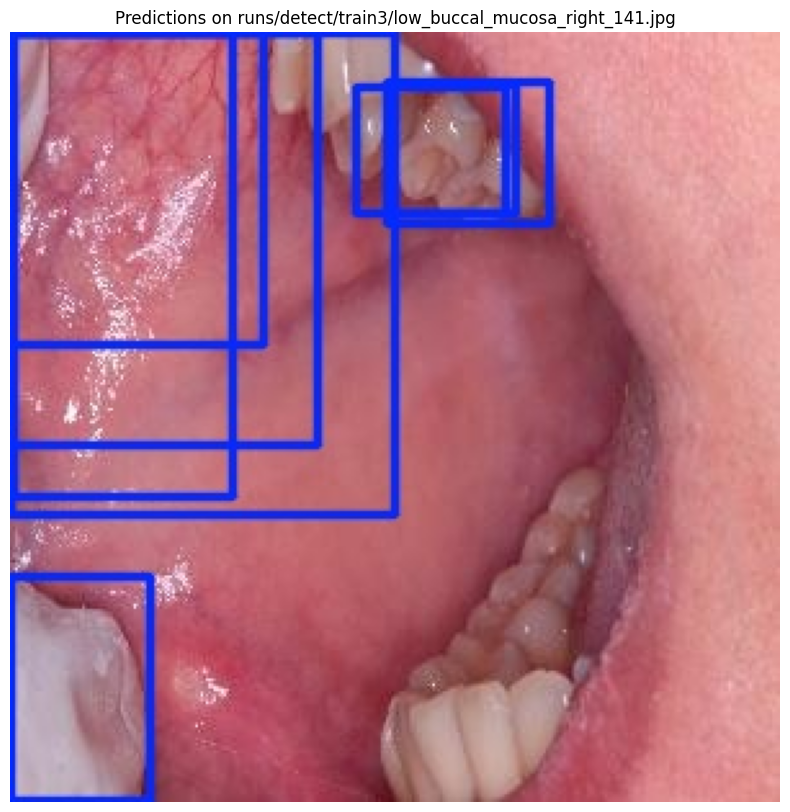

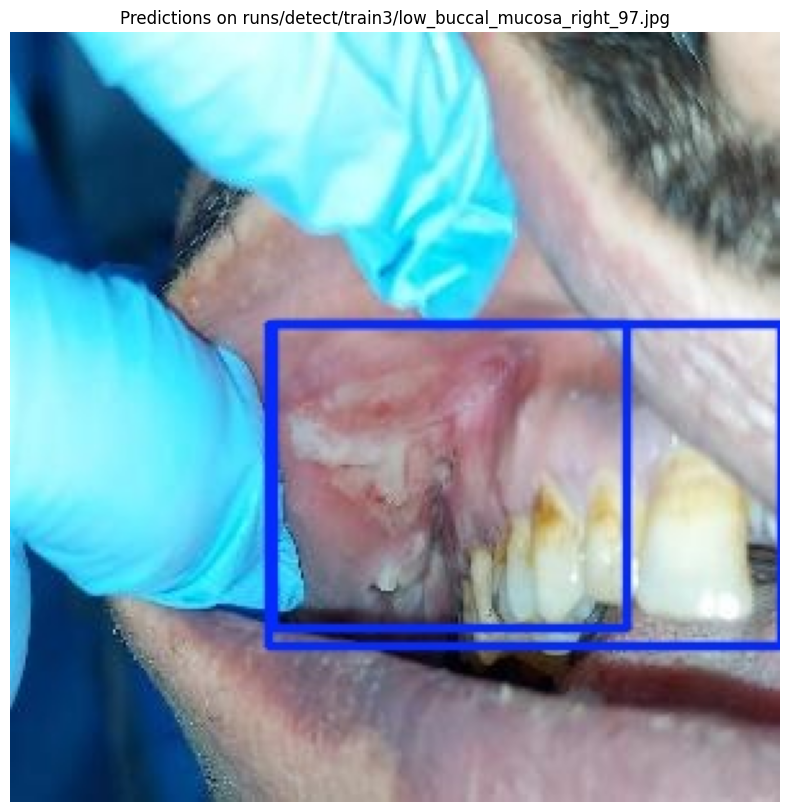

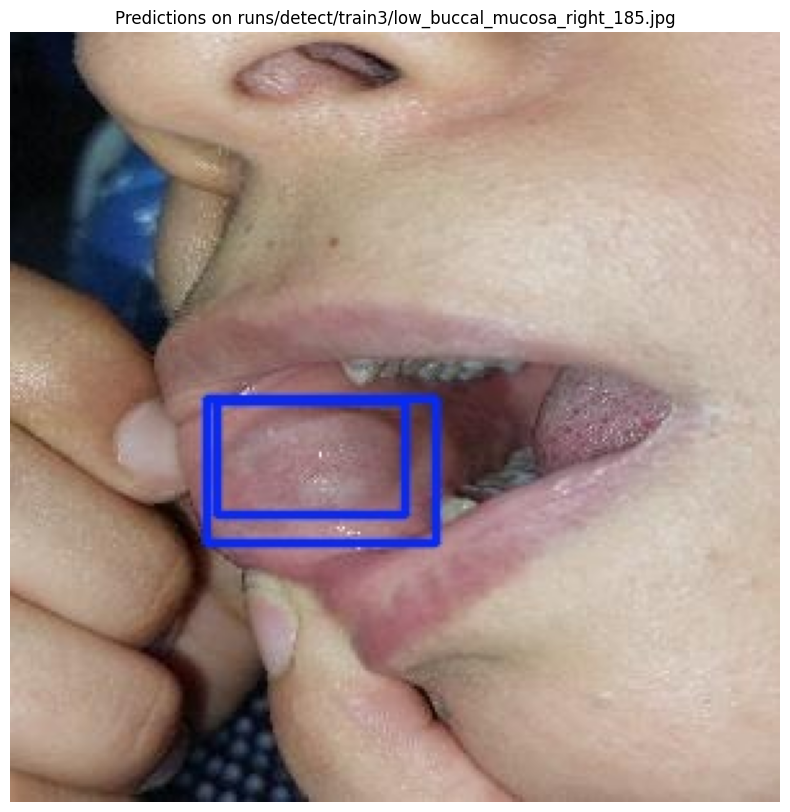

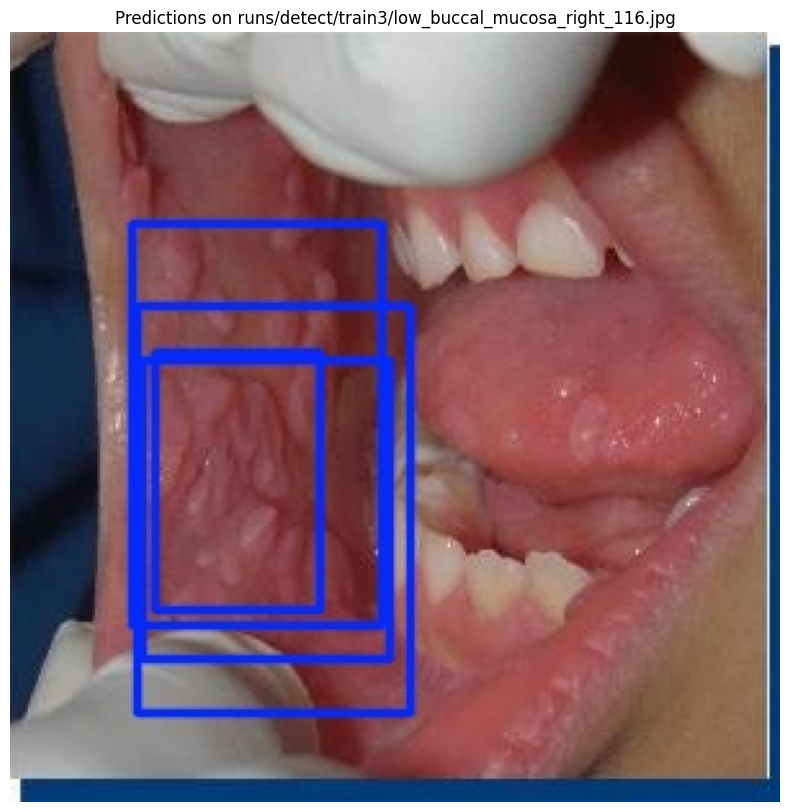

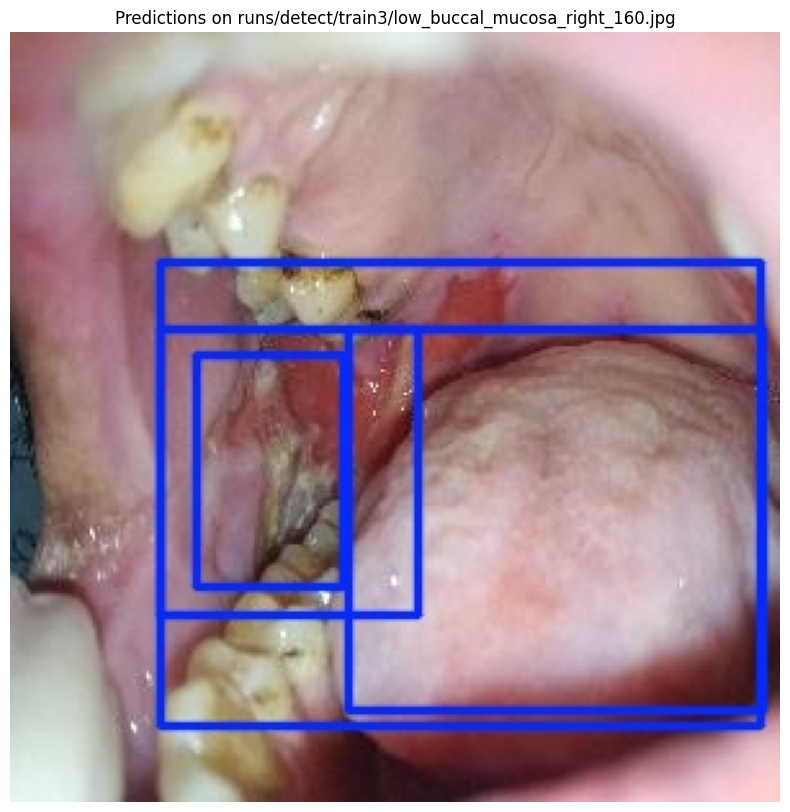

...

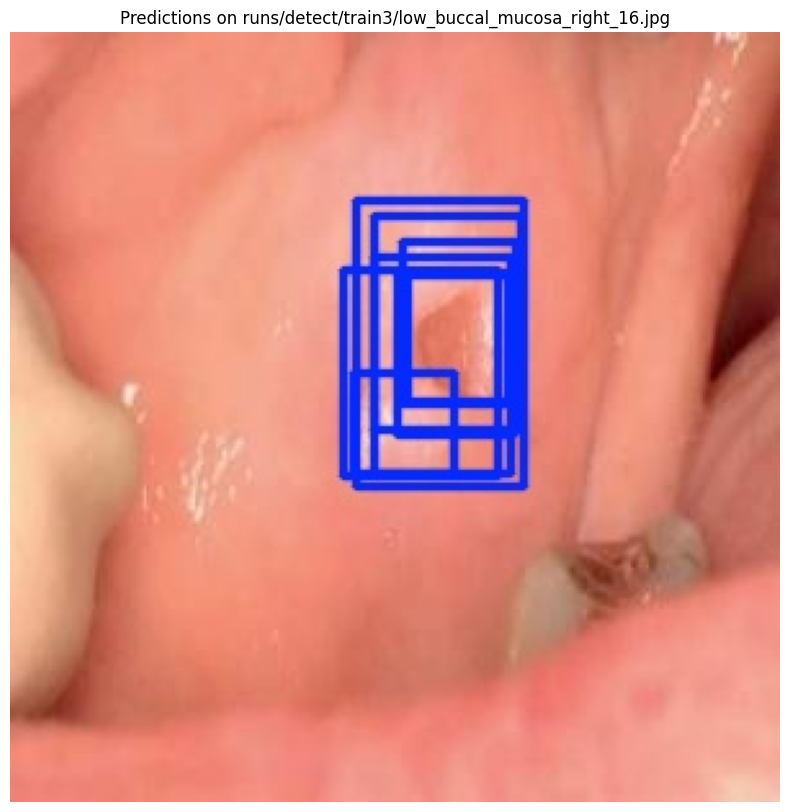

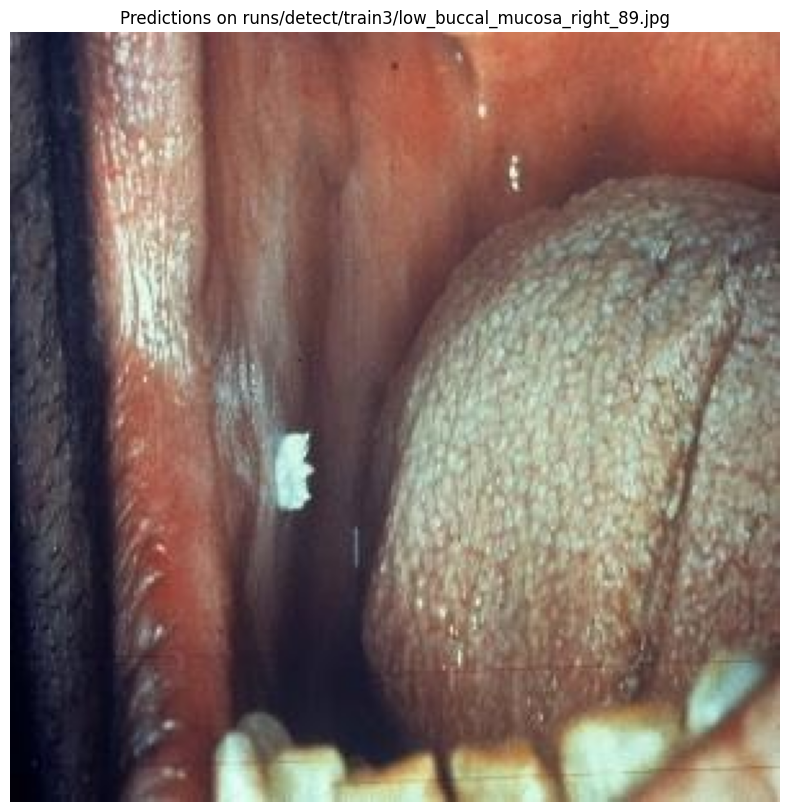

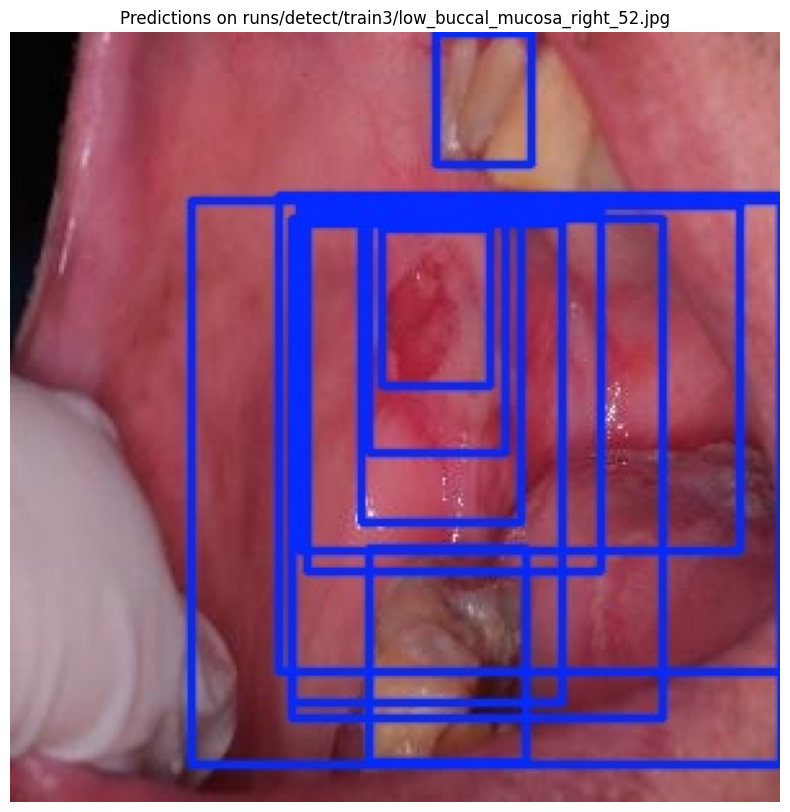

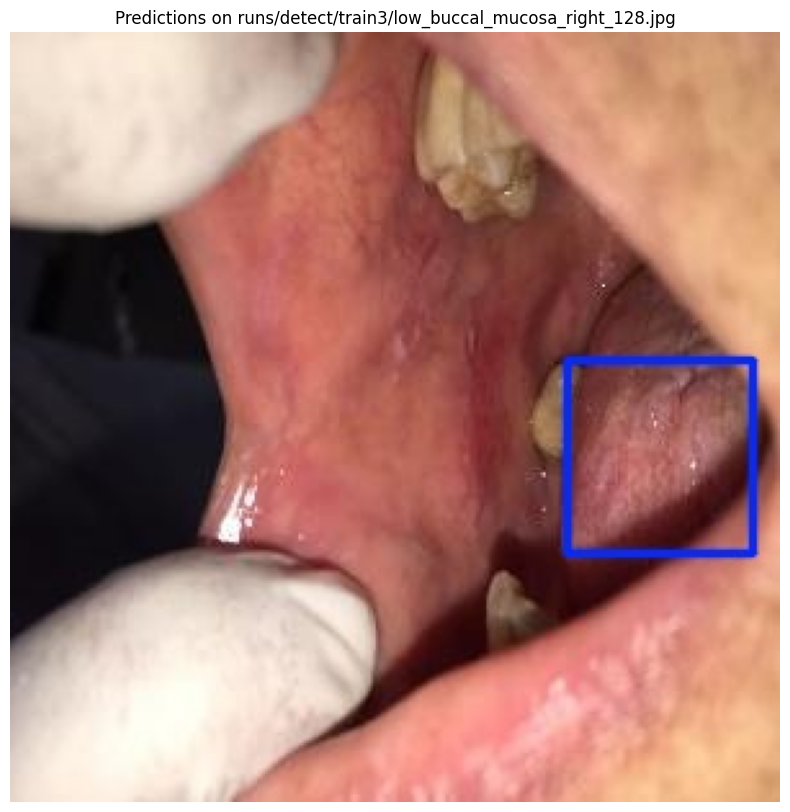

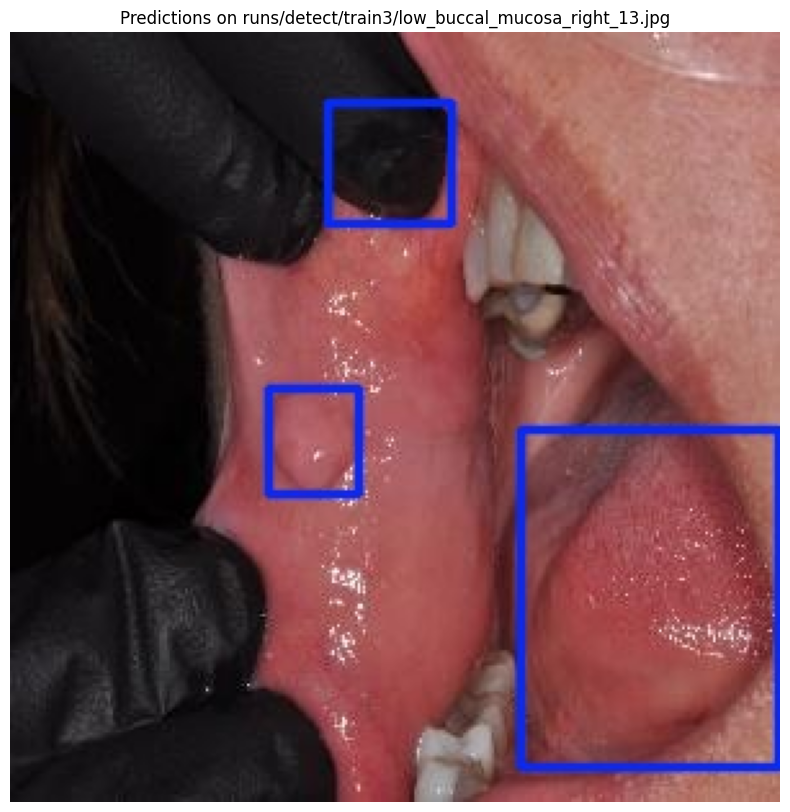

In [9]:
import cv2
import matplotlib.pyplot as plt
import glob

output_dir = 'runs/detect/train3/*.jpg'  # Adjust extension if needed

# Read and display each output image
for img_path in glob.glob(output_dir):
    # Read the image
    img = cv2.imread(img_path)
    
    # Convert BGR to RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.axis('off')  # Turn off axis
    plt.title(f"Predictions on {img_path}")
    plt.show()

In [ ]:
!zip -r train3.zip /kaggle/working/runs/detect/train3
from IPython.display import FileLink


# Display the download link
FileLink(r'train3.zip')